# Radar Image Visualisation

Loads the processed radar dataset (`database/processed_radar_dataset.pkl`) and visualises individual frames, time sequences, and basic statistics of the cropped radar images used for Kriging with External Drift.

In [1]:
%load_ext autoreload
%autoreload 2

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import matplotlib.animation as animation
from IPython.display import HTML

from src.utils import read_config
from src.radar.utils import load_processed_dataset
from src.visualization.main import visualise_singapore_outline

/opt/miniconda3/envs/fyp/lib/python3.13/site-packages/requests/__init__.py:86: RequestsDependencyWarning: Unable to find acceptable character detection dependency (chardet or charset_normalizer).
  warnings.warn(


In [40]:
# ── CHANGE THESE ──────────────────────────────────────────────────────────────
RADAR_PKL    = "database/processed_radar_dataset.pkl"
TIMESTEP_IDX = 20000     # single frame to inspect first
SEQ_START    = 21218      # start index for sequence / animation
SEQ_LEN      = 6      # number of frames in the sequence panel
ANIM_LEN     = 96     # number of frames to animate (96 × 15-min = 24 h)
INTERVAL_MS  = 150    # animation speed in milliseconds
# ──────────────────────────────────────────────────────────────────────────────

config = read_config("config.yaml")
BOUNDS = config["dataset_parameters"]["geography_bounds"]

In [26]:
# Load the processed radar pkl
radar_df = load_processed_dataset(RADAR_PKL)
radar_df = radar_df.sort_values("timestamp").reset_index(drop=True)

print(f"Loaded {len(radar_df)} radar frames")
print(f"Columns : {list(radar_df.columns)}")
print(f"Date range: {radar_df['timestamp'].iloc[0]}  →  {radar_df['timestamp'].iloc[-1]}")

# Inspect one frame to get image shape and bounds
_sample = radar_df.iloc[0]
_data   = np.array(_sample["data"])
print(f"\nSingle frame shape : {_data.shape}")
print(f"Value range        : [{np.nanmin(_data):.3f}, {np.nanmax(_data):.3f}]")
if "bounds" in radar_df.columns:
    print(f"Bounds             : {_sample['bounds']}")

Loaded 31503 radar frames
Columns : ['timestamp', 'data', 'bounds', 'crs', 'transform']
Date range: 2024-06-01 08:00:00  →  2025-05-01 07:45:00

Single frame shape : (31, 50)
Value range        : [0.000, 25.895]
Bounds             : BoundingBox(left=103.59855210085554, bottom=1.193961509939045, right=104.09595655398195, top=1.5014478991444642)


In [4]:
def get_frame_extent(row):
    """Return imshow extent [left, right, bottom, top] from a radar row."""
    if "bounds" in row.index and row["bounds"] is not None:
        b = row["bounds"]
        # rasterio BoundingBox or dict
        try:
            return [b.left, b.right, b.bottom, b.top]
        except AttributeError:
            return [b["left"], b["right"], b["bottom"], b["top"]]
    # Fallback to config bounds
    return [BOUNDS["left"], BOUNDS["right"], BOUNDS["bottom"], BOUNDS["top"]]


def plot_radar_frame(row, ax=None, cmap="Blues", vmin=0, vmax=None, title=None, show_outline=True):
    """Plot a single radar frame."""
    if ax is None:
        _, ax = plt.subplots(figsize=(8, 7))
    data   = np.array(row["data"], dtype=float)
    data   = np.where(data < 0, np.nan, data)   # mask no-data sentinel values
    extent = get_frame_extent(row)
    _vmax  = vmax if vmax is not None else np.nanpercentile(data, 99)
    im = ax.imshow(
        data,
        extent=extent,
        origin="upper",
        cmap=cmap,
        vmin=vmin,
        vmax=_vmax,
        aspect="auto",
        interpolation="nearest",
    )
    plt.colorbar(im, ax=ax, label="Radar reflectivity", shrink=0.8)
    if show_outline:
        visualise_singapore_outline(ax=ax)
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")
    ax.set_title(title or str(row["timestamp"]))
    ax.set_xlim(extent[0], extent[1])
    ax.set_ylim(extent[2], extent[3])
    return ax

## Single frame

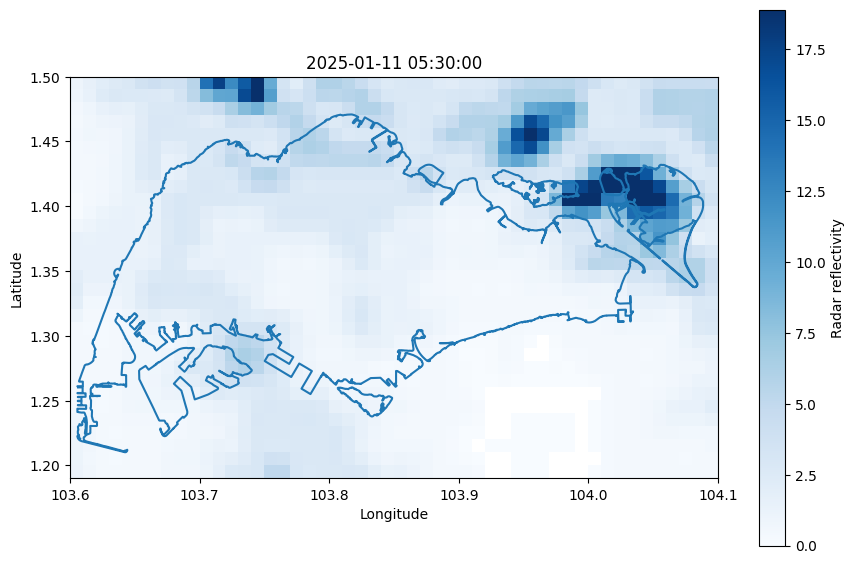

In [38]:
fig, ax = plt.subplots(figsize=(9, 7))
plot_radar_frame(radar_df.iloc[21220], ax=ax)
plt.tight_layout()
plt.show()

## Frame statistics

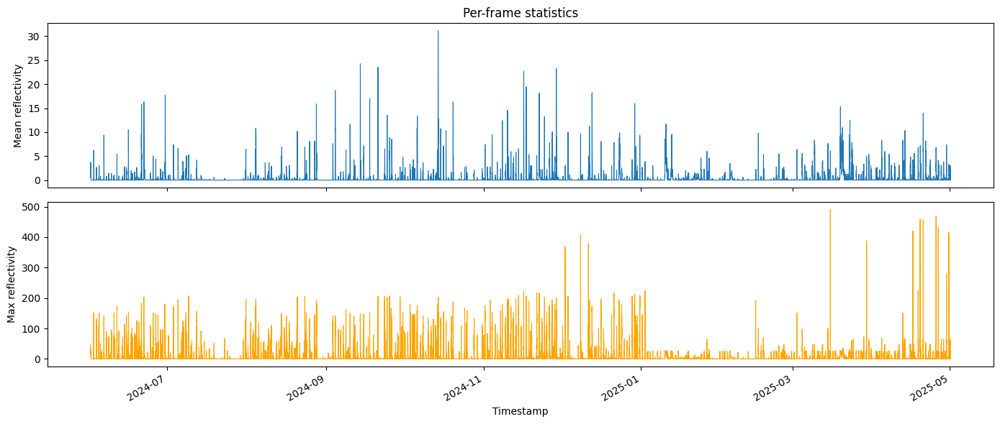

Overall mean : 0.3710
Overall max  : 490.4841


In [6]:
# Per-frame mean and max reflectivity over time
means = []
maxes = []
for _, row in radar_df.iterrows():
    d = np.array(row["data"], dtype=float)
    d = np.where(d < 0, np.nan, d)
    means.append(np.nanmean(d))
    maxes.append(np.nanmax(d))

fig, axes = plt.subplots(2, 1, figsize=(14, 6), sharex=True)
axes[0].plot(radar_df["timestamp"], means, lw=0.8)
axes[0].set_ylabel("Mean reflectivity")
axes[0].set_title("Per-frame statistics")
axes[1].plot(radar_df["timestamp"], maxes, lw=0.8, color="orange")
axes[1].set_ylabel("Max reflectivity")
axes[1].set_xlabel("Timestamp")
fig.autofmt_xdate()
plt.tight_layout()
plt.show()

print(f"Overall mean : {np.nanmean(means):.4f}")
print(f"Overall max  : {np.nanmax(maxes):.4f}")

## Sequence of frames

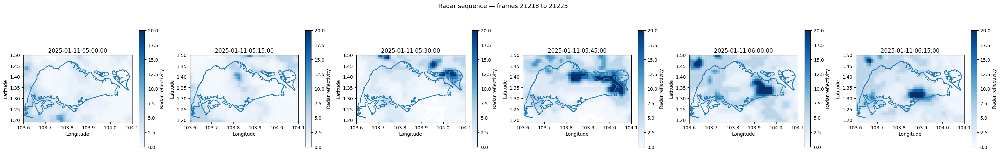

In [41]:
n       = SEQ_LEN
subset  = radar_df.iloc[SEQ_START : SEQ_START + n]
_global_vmax = max(
    np.nanpercentile(np.array(r["data"], dtype=float), 99)
    for _, r in subset.iterrows()
)

fig, axes = plt.subplots(1, n, figsize=(5 * n, 5))
if n == 1:
    axes = [axes]

for ax, (_, row) in zip(axes, subset.iterrows()):
    plot_radar_frame(row, ax=ax, vmax=20)

fig.suptitle(f"Radar sequence — frames {SEQ_START} to {SEQ_START + n - 1}", fontsize=13)
plt.tight_layout()
plt.show()

## Animation

In [18]:
anim_subset = radar_df.iloc[SEQ_START : SEQ_START + ANIM_LEN]
frames_data = [
    np.where(np.array(r["data"], dtype=float) < 0, np.nan, np.array(r["data"], dtype=float))
    for _, r in anim_subset.iterrows()
]
_vmax = np.nanpercentile(np.stack(frames_data), 99)
_extent = get_frame_extent(anim_subset.iloc[0])

fig, ax = plt.subplots(figsize=(9, 7))
im = ax.imshow(
    frames_data[0],
    extent=_extent,
    origin="upper",
    cmap="Blues",
    vmin=0,
    vmax=_vmax,
    aspect="auto",
    interpolation="nearest",
    animated=True,
)
plt.colorbar(im, ax=ax, label="Radar reflectivity", shrink=0.8)
visualise_singapore_outline(ax=ax)
ax.set_xlabel("Longitude")
ax.set_ylabel("Latitude")
ax.set_xlim(_extent[0], _extent[1])
ax.set_ylim(_extent[2], _extent[3])
title = ax.set_title(str(anim_subset.iloc[0]["timestamp"]), fontsize=11)

def _update(i):
    im.set_data(frames_data[i])
    title.set_text(str(anim_subset.iloc[i]["timestamp"]))
    return im, title

anim = animation.FuncAnimation(
    fig, _update, frames=len(frames_data), interval=INTERVAL_MS, blit=True
)
plt.close()
HTML(anim.to_jshtml())

## Pixel value distribution

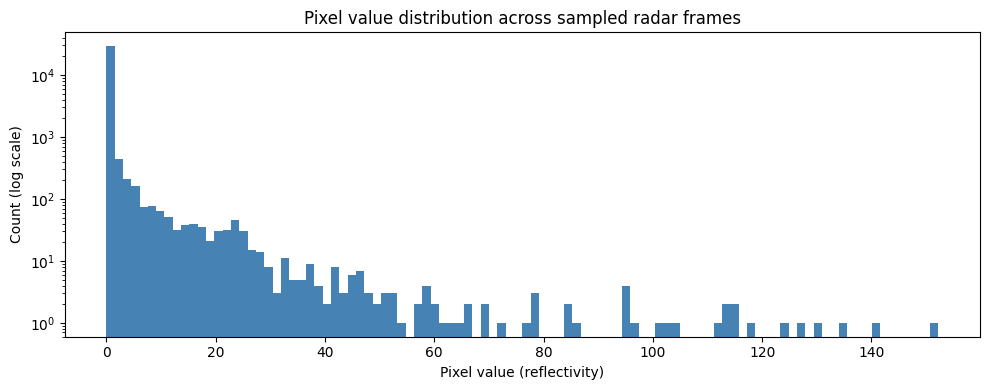

Sampled pixels : 30,690
p50: 0.000
p95: 1.526
p99: 18.820
max: 152.244


In [9]:
# Sample up to 20 frames for the histogram to keep it fast
sample_rows = radar_df.sample(min(20, len(radar_df)), random_state=0)
all_vals = np.concatenate([
    np.array(r["data"], dtype=float).flatten()
    for _, r in sample_rows.iterrows()
])
all_vals = all_vals[~np.isnan(all_vals) & (all_vals >= 0)]

fig, ax = plt.subplots(figsize=(10, 4))
ax.hist(all_vals, bins=100, log=True, color="steelblue", edgecolor="none")
ax.set_xlabel("Pixel value (reflectivity)")
ax.set_ylabel("Count (log scale)")
ax.set_title("Pixel value distribution across sampled radar frames")
plt.tight_layout()
plt.show()

print(f"Sampled pixels : {len(all_vals):,}")
print(f"p50: {np.percentile(all_vals, 50):.3f}")
print(f"p95: {np.percentile(all_vals, 95):.3f}")
print(f"p99: {np.percentile(all_vals, 99):.3f}")
print(f"max: {all_vals.max():.3f}")